# BlueSky Project
<span style="font-family:Lucida Sans Unicode; font-size:1.3em;">Social Media Analisys</span>

#### Configurazioni

dataset: https://zenodo.org/records/11082879


In [1]:
!pip install igraph
!pip install vispy
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.3 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 29.0 MB/s eta 0:00:0000:01

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.3 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.9/241.9 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.6/124.6 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.7/318.7 kB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.9/208.9 kB 24.3 MB/s eta 0:00:00

[notice] A new r

In [2]:
import json
import os
import pandas as pd

dataset_path = "/kaggle/input/bluesky-dataset/bluesky_dataset/"
feed_path ="/kaggle/input/bluesky-dataset/"

## 1. Step di Preprocessing - Esclusione dei Post senza Interazioni Significative
Il primo passo dell'analisi consiste nell'eseguire una fase di preprocessing per rendere il dataset utilizzabile nelle fasi successive.

Come primo step di preprocessing, si è deciso di escludere quei post che non contribuiscono in modo significativo all'analisi. In particolare, i post che non presentano interazioni del tipo "like" sono considerati meno rilevanti ai fini dello studio. Inoltre, i post senza "like" hanno anche meno probabilità di avere altri tipi di interazioni, come commenti, repost o citazioni.


Pertanto, sono stati filtrati tutti i post nel dataset con un 'like_count' inferiore a 1. Questo permette di ridurre il rumore nel dataset e di concentrare l'attenzione sui post che mostrano un reale coinvolgimento da parte degli utenti. Questo passaggio di filtraggio rappresenta un'importante ottimizzazione nelle prime fasi della preparazione dei dati, focalizzando l'analisi su quei post che dimostrano una certa interazione significativa.

---
_Nota_: eseguire le celle di questa sezione una sola volta.


In [ ]:
import os
import pandas as pd

posts_folder = dataset_path + "final_posts/"
dfs = []

total_posts = 0
filtered_posts = 0
n_file=1

# Filtra i file in base al nome
for file in os.listdir(posts_folder):
    # Controlla se il file è nel formato corretto e nel range desiderato
    if file.endswith('.jsonl') and file[:-6].isdigit():  # Verifica che il nome del file sia un numero
        file_index = int(file[:-6])  # Rimuovi '.jsonl' e converti in int
        if 0 <= file_index > 50:  
            file_path = os.path.join(posts_folder, file)
            print(f"Processing file: {file}, {n_file}", flush=True)
            
            n_file += 1
        
            
            df = pd.read_json(file_path, lines=True)
            
            # aggiorniamo il numero totale di post
            total_posts += df.shape[0]
            
            # filtriamo
            filtered_df = df[df['like_count'] >= 1]
            
            # aggiorniamoci il numero totale di post filtrati
            filtered_posts += filtered_df.shape[0]
            
            dfs.append(filtered_df)

# aggreghiamo i risultati parziali
df_all_posts = pd.concat(dfs, ignore_index=True)

print("\nPrime righe del DataFrame df_all_posts")
print(df_all_posts.head())

excluded_posts = total_posts - filtered_posts
percentage_excluded = (excluded_posts / total_posts) * 100
print(f"\nTotale post: {total_posts}")
print(f"Post inclusi dopo il filtraggio: {filtered_posts}")
print(f"Post esclusi: {excluded_posts}")
print(f"Percentuale di post esclusi: {percentage_excluded:.2f}%")

In [ ]:
# Salva il DataFrame df_all_posts in un file CSV
output_file_path = '/kaggle/working/50_2_posts.csv'  # Adjust the path as needed
df_all_posts.to_csv(output_file_path, index=False, escapechar='\\', errors='ignore')

print(f"\nDataFrame salvato in: {output_file_path}")

<span style="font-size:1.2em;">**Totale post**: 235179574</span> 
  
<span style="font-size:1.2em;">**Post inclusi dopo il filtraggio**: 181064674</span> 
  
<span style="font-size:1.2em;">**Post esclusi**: 54114900</span> 
  
<span style="font-size:1.2em;">**Percentuale di post esclusi**: 23.01%</span> 

---

## 2. Creazione di due insiemi di post: dentro e fuori dai feed

Continuiamo la nostra analisi separando i post in due insiemi: 
- feed_posts: contiene tutti i post che compaiono all'inteno di uno dei feed analizzati
- outside_feed_posts: contiene i post che sono stati pubblicati dagli utenti al di fuori dei feed

Questo ci permetterà di analizzare il comportamento degli utenti dentro e fuori dei feed. 
Per fare ciò sfruttiamo i file feed_posts.tar.gz e i file csv salvati nella fase di preprocessing. 

Iniziamo creando il DataFrame contenente i posts dentro i feed.

Creiamo anche un dizionario contenente i post divisi per feed, ci servirà per le analisi successive.


In [3]:
# Dizionario per tenere traccia dei DataFrame per ogni feed
feed_dataframes = {}

feed_folder = feed_path + "feed_posts/"
df_feed_posts = []  # Lista per tenere traccia di tutti i post

# Carica i post per ciascun feed
for dir in os.listdir(feed_folder):
    feed_posts = []
    feed_name = dir  # Usa il nome della directory come nome del feed
    
    with open(feed_folder + dir, 'r') as f: #+ '/' + file, 'r') as f:
        for line in f:
            feed_posts.append(json.loads(line))
    
    # Converti i post del feed corrente in un DataFrame
    p_feed_posts = pd.DataFrame(feed_posts)
    
    # Aggiungi il DataFrame al dizionario usando il nome del feed come chiave
    feed_dataframes[feed_name] = p_feed_posts

    df_feed_posts.append(p_feed_posts)

    
# Concatenare tutti i DataFrame dei feed in un unico DataFrame
df_all_feeds = pd.concat(df_feed_posts, ignore_index=True)


# Verifica: stampa le prime righe di ogni DataFrame per ciascun feed
for feed_name, df in feed_dataframes.items():
    print(f"\nPrime righe del feed '{feed_name}':\n")
    print(df.head())

# Mostra le prime righe del DataFrame che contiene tutti i post
print("\nPrime righe del DataFrame che contiene tutti i post:\n")
print(df_all_feeds.head())


Prime righe del feed 'Whats History.jsonl':

     post_id  user_id     instance          date  \
0   47380851   322788  bsky.social  202403182357   
1   26346656   582545  bsky.social  202403182342   
2   74495350    51435  bsky.social  202403182145   
3  125259855    36935  bsky.social  202403182052   
4   68873777   560953  bsky.social  202403182046   

                                                text  langs  like_count  \
0  Pigeon-shooting contests were a popular sport ...  [eng]          23   
1  "The sculpture park is the third site created ...  [eng]          41   
2  August 1940 episode of ‘Islands at War’ is out...  [eng]          10   
3  NEW: This week's instalment of 'Stop, Look, an...  [eng]           7   
4  A photograph of a Japanese American soldier. C...  [eng]          14   

   reply_count  repost_count reply_to replied_author thread_root  \
0            1             8     None           None        None   
1            1            11     None           None  

/tmp/ipykernel_30/725893736.py:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_all_feeds = pd.concat(df_feed_posts, ignore_index=True)


Creiamo ora il DataFrame contenente i posts fuori dal feed.

In [4]:
# Carichiamo i post dai file salvati durante la fase di preprocessing
input_path1='/kaggle/input/posts-bluesky/50_posts.csv'
input_path2='/kaggle/input/posts-bluesky/50_2_posts.csv'

df_all_post=pd.DataFrame()

df1=pd.read_csv(input_path1)
df2=pd.read_csv(input_path2)

df_all_posts = pd.concat([df1, df2], ignore_index=True)
print("Number of posts: ",len(df_all_posts))

/tmp/ipykernel_30/2446913402.py:7: DtypeWarning: Columns (0,1,2,3,4,5,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df1=pd.read_csv(input_path1)
/tmp/ipykernel_30/2446913402.py:8: DtypeWarning: Columns (0,1,2,3,4,5,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df2=pd.read_csv(input_path2)


Number of posts:  133964324


In [5]:
# Consideriamo l'id dei post per creare un DataFrame contenente i post fuori dai feed
feed_post_ids = set(df_all_feeds['post_id'])
all_post_ids = set(df_all_posts['post_id'])

outside_feed_post_ids = all_post_ids - feed_post_ids  
df_outside_feed_posts = df_all_posts[df_all_posts['post_id'].isin(outside_feed_post_ids)]
    
# Stampiamo le prime righe per verifica
print("Prime righe del DataFrame df_outside_feed_posts")
print(df_outside_feed_posts.head())

Prime righe del DataFrame df_outside_feed_posts
    post_id  user_id     instance                     date  \
0  55062431  2386462  bsky.social  1976-05-31 15:06:22.215   
1  55062432  2386462  bsky.social  1976-05-31 15:06:21.419   
2  55062433  2386462  bsky.social  1976-05-31 15:06:20.546   
3  55062434  2386462  bsky.social  1976-05-31 15:06:20.544   
4  55062435  2386462  bsky.social  1976-05-31 15:06:20.505   

                                                text    langs  like_count  \
0           熱下がったー！この体質って治るのかな？すぐ下がるけど熱出るとしんどいはしんどい！  ['jpn']         3.0   
1  遊ぶ前までにお仕事終わらせなきゃって焦りすぎたかもしれない。気楽にいこうね( ˘ω˘ ) ｽﾔｧ…  ['jpn']         3.0   
2             病院で下の名前呼んでもらえるのちょっと嬉しい。しかも綺麗なお姉さんに！へへっ  ['jpn']         1.0   
3                        歯抜かなくていいって！\nやったー\\( ´ω` )/  ['jpn']         2.0   
4                                      うわぁぁあ\n美味しそう🤤  ['jpn']         1.0   

   reply_count  repost_count    reply_to  replied_author  thread_root  \
0          1.0           0.0         NaN   

Stampiamo alcune informazioni sui due insiemi ottenuti.

In [6]:
# Numero totale dei post nei due insiemi
print(f"Numero totale di post dentro i feed: {len(df_all_feeds)}")
print(f"Numero totale di post fuori dai feed: {len(df_outside_feed_posts)}")

# Tipi di dati delle colonne
print("\nTipi di dati per le colonne nel DataFrame df_all_feeds:")
print(df_all_feeds.dtypes)

print("\nTipi di dati per le colonne nel DataFrame df_outside_feed_posts:")
print(df_outside_feed_posts.dtypes)

Numero totale di post dentro i feed: 168463
Numero totale di post fuori dai feed: 133870706

Tipi di dati per le colonne nel DataFrame df_all_feeds:
post_id                 int64
user_id                 int64
instance               object
date                    int64
text                   object
langs                  object
like_count              int64
reply_count             int64
repost_count            int64
reply_to              float64
replied_author        float64
thread_root           float64
thread_root_author    float64
quotes                float64
quoted_author         float64
labels                 object
dtype: object

Tipi di dati per le colonne nel DataFrame df_outside_feed_posts:
post_id                object
user_id                object
instance               object
date                   object
text                   object
langs                  object
like_count            float64
reply_count           float64
repost_count          float64
reply_to             

In definitiva, risultano:  

<span style="font-size:1.2em;">**Numero totale di post dentro feed**: 168463</span>  
  
<span style="font-size:1.2em;">**Numero totale di post fuori feed**: 133870706</span>

## 3. Identificazione degli utenti rilevanti
Identifichiamo gli utenti rilevanti per le nostre analisi ovvero quelli che hanno creato almeno un post sia dentro i feed che fuori dai feed. Manteniamo solo questi utenti per le analisi successive infatti gli altri utenti non possono essere confrontati. Questo permetterà anche di ridurre le dimensioni dei grafi di interazione.  

In particolare:
- Vogliamo misurare l'endorsement degli utenti che contribuiscono attivamente alla creazione di contenuti in entrambi gli insiemi di posts. Decidiamo quidi di eliminare dallo studio non solo questi utenti ma anche tutti i loro post in modo tale da poter confrontare il loro endorsement per il nostro task.
- Anche se filtriamo gli utenti e quindi i relativi post, manteniamo tutte le interazioni originali nel dataset relative ai posts considerati. Ciò preserva il contesto delle interazioni, fondamentali per l'analisi delle dinamiche sociali che altrimentri verrebbero ristrette ai soli utenti attivi in entrambi gli insiemi, facendo perdere delle informazioni importanti e significative ai fini dello studio.

In [7]:
# Usiamo gli user_id presenti nei due DataFrame per ottenere gli utenti rilevanti
users_in_feed = set(df_all_feeds['user_id'])
users_outside_feed = set(df_outside_feed_posts['user_id'])

print(f"Numero di utenti che hanno postato dentro i feed: {len(users_in_feed)}")
print(f"Numero di utenti che hanno postato fuori dai feed: {len(users_outside_feed)}")

users = users_in_feed.intersection(users_outside_feed)

print(f"Numero di utenti che hanno postato sia dentro che fuori dai feed: {len(users)}")

Numero di utenti che hanno postato dentro i feed: 5237
Numero di utenti che hanno postato fuori dai feed: 4798708
Numero di utenti che hanno postato sia dentro che fuori dai feed: 3392


Ora filtriamo i post in entrambi i DataFrame per considerare solo quelli creati da utenti che hanno postato sia dentro che fuori dai feed.

In [8]:
# Stampiamo il numero dei post filtrati
print(f"Numero di post dentro i feed prima del filtraggio: {len(df_all_feeds)}")
print(f"Numero di post fuori dai feed prima del filtraggio: {len(df_outside_feed_posts)}")

df_all_feeds = df_all_feeds[df_all_feeds['user_id'].isin(users)]
df_outside_feed_posts = df_outside_feed_posts[df_outside_feed_posts['user_id'].isin(users)]

# Stampiamo il numero dei post filtrati
print(f"Numero di post dentro i feed: {len(df_all_feeds)}")
print(f"Numero di post fuori dai feed: {len(df_outside_feed_posts)}")

Numero di post dentro i feed prima del filtraggio: 168463
Numero di post fuori dai feed prima del filtraggio: 133870706
Numero di post dentro i feed: 102541
Numero di post fuori dai feed: 3569931


In [14]:
import pandas as pd
df_outside_feed_posts= pd.read_json("/kaggle/input/outside-feed-posts/outside_feed_limited_posts.json")
df_outside_feed_posts.to_json("df_outside_feed_posts.json", orient='records', lines=True, indent=4)

Applichiamo questo filtraggio anche ai singoli feed:

In [15]:
# Filtriamo ciascun feed nel dizionario usando la lista di utenti rilevanti
for feed_name, df in feed_dataframes.items():
    feed_dataframes[feed_name] = df[df['user_id'].isin(df_all_feeds['user_id'])]

    # Stampa il numero di post rimanenti in ogni feed
    print(f"Numero di post nel feed '{feed_name}' dopo il filtraggio: {len(feed_dataframes[feed_name])}")

Numero di post nel feed 'Whats History.jsonl' dopo il filtraggio: 109
Numero di post nel feed 'Disability.jsonl' dopo il filtraggio: 374
Numero di post nel feed 'GreenSky.jsonl' dopo il filtraggio: 429
Numero di post nel feed 'Game Dev.jsonl' dopo il filtraggio: 397
Numero di post nel feed 'News.jsonl' dopo il filtraggio: 24704
Numero di post nel feed 'BookSky.jsonl' dopo il filtraggio: 425
Numero di post nel feed 'AcademicSky.jsonl' dopo il filtraggio: 653
Numero di post nel feed 'Blacksky.jsonl' dopo il filtraggio: 50961
Numero di post nel feed 'Political Science.jsonl' dopo il filtraggio: 52
Numero di post nel feed 'UkrainianView.jsonl' dopo il filtraggio: 1473
Numero di post nel feed 'Science.jsonl' dopo il filtraggio: 22964


## 4. Creazione dei grafi di interazione

Per analizzare le interazioni tra utenti, creiamo due grafi di interazioni distinti: uno rappresenta le interazioni relative ai post all'interno dei feed, l'altro riguarda i post al di fuori dei feed. \
In questi grafi, i nodi corrispondono agli utenti, mentre gli archi rappresentano le interazioni tra di essi. In particolare consideriamo tre tipi di interazioni: commenti, repost e citazioni. Un arco di tipo commento tra un nodo `A` e un nodo `B` indica che l'utente `A` ha commentato un post dell'utente `B`. Discorso analogo per gli altri due tipi di archi. \
Non includiamo i like, poiché dai dati a disposizione non è possibile risalire a quando un utente mette like al post di un altro utente al di fuori dai feed.

### 4.1 Interazioni di tipo Repost nei feed posts
Prima di procedere con la creazione dei grafi, notiamo che nel DataFrame contenente i post all'interno dei feed sono presenti informazioni su commenti e citazioni, ma mancano i dati relativi ai repost.  
È quindi necessario includere le interazioni di tipo 'repost' per i post nei feed. Poiché queste informazioni non sono direttamente disponibili nel dataset, applichiamo operazioni di filtraggio per ottenerle.

In [16]:
# Selezioniamo le colonne relative ai repost da df_all_posts
df_reposts = df_all_posts[['post_id', 'repost_from', 'reposted_author']]
df_reposts = df_reposts.drop_duplicates(subset='post_id')

# Aggiungiamo tali colonne al dataset df_all_feeds effettuando una join tra df_all_feeds e df_reposts sulla colonna 'post_id'
df_feeds_posts = df_all_feeds.merge(df_reposts, on='post_id', how='left')


# Effettuaiamo la stessa operazione per DataFrame di ciascun feed
for feed_name, df in feed_dataframes.items():
    # Effettua una join tra il DataFrame del feed e df_reposts basandosi sulla colonna 'post_id'
    feed_dataframes[feed_name] = df.merge(df_reposts, on='post_id', how='left')
    
    # Verifica: stampa il numero di post dopo la join e alcune righe del DataFrame aggiornato
    print(f"Numero di post nel feed '{feed_name}' dopo la join: {len(feed_dataframes[feed_name])}")
    print(feed_dataframes[feed_name].head())


# Verifica del risultato
print(f"Numero di post nel DataFrame df_all_feeds: {len(df_all_feeds)}")
print(f"Numero di post nel DataFrame df_feeds_posts: {len(df_feeds_posts)}")
#print(df_feeds_posts.head())

Numero di post nel feed 'Whats History.jsonl' dopo la join: 109
     post_id  user_id     instance          date  \
0   47380851   322788  bsky.social  202403182357   
1   74495350    51435  bsky.social  202403182145   
2  125259855    36935  bsky.social  202403182052   
3     930251   482292  bsky.social  202403182000   
4  142779054   272206  bsky.social  202403181930   

                                                text  langs  like_count  \
0  Pigeon-shooting contests were a popular sport ...  [eng]          23   
1  August 1940 episode of ‘Islands at War’ is out...  [eng]          10   
2  NEW: This week's instalment of 'Stop, Look, an...  [eng]           7   
3  FWW hist friends 📢 Check out the War Ephemera ...  [eng]           4   
4  Every time I open up my copy of Eulalia Guzman...  [eng]           6   

   reply_count  repost_count reply_to replied_author thread_root  \
0            1             8     None           None        None   
1            0             2     Non

### 4.2 Generazione dei grafi di interazione

A questo punto possiamo procedere con la generazione dei grafi di interazione.

Per ottenere le informazioni riguardo ai commenti, ai repost e alle citazioni, sfruttiamo i dati presenti nei DataFrame `df_all_feeds` e `df_outside_feed_posts`. \
Questi DataFrame contengono diversi campi utili per tracciare le interazioni, tra cui:
- **user_id**: l'ID dell'utente che ha creato il post.
- **replied_author**: l'ID dell'autore del post a cui l'utente user_id ha risposto con il suo post. Questo indica la partecipazione a un thread di conversazione.
- **reposted_author**: l'ID dell'autore del post che l'utente user_id ha ripubblicato all'interno del suo post).
- **quoted_author**: l'ID dell'autore del post che l'utente user_id ha citato all'interno del suo post.

Questi campi ci forniscono già una mappatura delle interazioni tra utenti. Ad esempio, nel DataFrame `df_all_feeds`, la coppia `(user_id, reposted_author)` indica che l'utente user_id ha ripostato un post di reposted_author all'interno di un feed. Allo stesso modo, nel DataFrame `df_outside_feed_posts`, la stessa coppia segnala che l'utente user_id ha ripostato un post di replied_author al di fuori dei feed, nella pagina principale di Bluesky.

Estraiamo quindi le interazioni direttamente da questi due DataFrame, garantendo una distinzione tra quelle avvenute all'interno e al di fuori dei feed.

In [19]:
import networkx as nx
from collections import Counter

# Funzione per creare un grafo di interazione
def get_interactions_graph(df):
    
    G = nx.DiGraph()

    # Archi per i commenti
    reply_pairs = df[['user_id', 'replied_author']].dropna()
    G.add_edges_from(reply_pairs.apply(tuple, axis=1), interaction='comment')

    # Archi per i reposts
    repost_pairs = df[['user_id','reposted_author']].dropna()
    G.add_edges_from(repost_pairs.apply(tuple, axis=1), interaction='repost')

    # Archi per le citazioni
    quote_pairs = df[['user_id', 'quoted_author']].dropna()
    G.add_edges_from(quote_pairs.apply(tuple, axis=1), interaction='quote')

    return G


# Funzione per ottenere il grafo di interazione pesato
def get_weighted_graph(df):
    
    G = nx.DiGraph()

    # Contatore per tutte le interazioni (commenti, reposts, citazioni)
    interaction_counter = Counter()

    # Conta i commenti
    reply_pairs = df[['user_id', 'replied_author']].dropna()
    interaction_counter.update(reply_pairs.apply(tuple, axis=1))

    # Conta i repost
    repost_pairs = df[['user_id', 'reposted_author']].dropna()
    interaction_counter.update(repost_pairs.apply(tuple, axis=1))

    # Conta le citazioni
    quote_pairs = df[['user_id', 'quoted_author']].dropna()
    interaction_counter.update(quote_pairs.apply(tuple, axis=1))

    # Aggiungi archi pesati
    for (user, target), count in interaction_counter.items():
        if count > 1:  # Crea l'arco solo se c'è più di una interazione
            G.add_edge(user, target, weight=count)

    return G

---
_Nota_: eseguide le prossime celle una sola volta

In [ ]:
# Creiamo il grafo delle interazioni all'interno dei feed
feed_graph = get_interactions_graph(df_feeds_posts)

print(f"Grafo di interazioni nei feed - Nodi: {feed_graph.number_of_nodes()}, Archi: {feed_graph.number_of_edges()}")

In [ ]:
# Creiamo il grafo per le interazioni fuori dai feed
outside_feed_graph = get_interactions_graph(df_outside_feed_posts)

print(f"Grafo di interazioni fuori dai feed - Nodi: {outside_feed_graph.number_of_nodes()}, Archi: {outside_feed_graph.number_of_edges()}")

In [ ]:
# Creiamo il grafo pesato delle interazioni all'interno dei feed
weighted_feed_graph = get_weighted_graph(df_feeds_posts)

print(f"Grafo di interazioni pesato nei feed - Nodi: {weighted_feed_graph.number_of_nodes()}, Archi: {weighted_feed_graph.number_of_edges()}")

In [ ]:
# Creiamo il grafo pesato delle interazioni fuori dai feed
weighted_outside_feed_graph = get_weighted_graph(df_outside_feed_posts)

print(f"Grafo di interazioni pesato fuori dai feed - Nodi: {weighted_outside_feed_graph.number_of_nodes()}, Archi: {weighted_outside_feed_graph.number_of_edges()}")

Salviamo i grafi ottenuti per evitare di doverli costruire ogni volta.

In [ ]:
import pickle
from IPython.display import FileLink

# Salviamo i quattro grafi di interazioni

with open('feed_graph.gpickle', 'wb') as f:
    pickle.dump(feed_graph, f)

    
with open('outside_feed_graph.gpickle', 'wb') as f:
    pickle.dump(outside_feed_graph, f)


with open('weighted_feed_graph.gpickle', 'wb') as f:
    pickle.dump(weighted_feed_graph, f)


with open('weighted_outside_feed_graph.gpickle', 'wb') as f:
    pickle.dump(weighted_outside_feed_graph, f)

# Creiamo i link di download per tutti i file
print(FileLink('feed_graph.gpickle'))
print(FileLink('outside_feed_graph.gpickle'))
print(FileLink('weighted_feed_graph.gpickle'))
print(FileLink('weighted_outside_feed_graph.gpickle'))


---

Carichiamo i quattro grafi di interazioni costruiti. 

In [24]:
import pickle

# Carichiamo i quattro grafi delle interazioni
graph_folder_path = '/kaggle/input/interaction-graphs/'

with open(graph_folder_path + 'feed_graph.gpickle', 'rb') as f:
    feed_graph = pickle.load(f)


with open(graph_folder_path + 'outside_feed_graph.gpickle', 'rb') as f:
    outside_feed_graph = pickle.load(f)


with open(graph_folder_path + 'weighted_feed_graph.gpickle', 'rb') as f:
    weighted_feed_graph = pickle.load(f)


with open(graph_folder_path + 'weighted_outside_feed_graph.gpickle', 'rb') as f:
    weighted_outside_feed_graph = pickle.load(f)

    
# Verifichiamo che i grafi siano stati caricati correttamente
print(f"Feed graph - Nodi: {feed_graph.number_of_nodes()}, Archi: {feed_graph.number_of_edges()}")
print(f"Outside feed graph - Nodi: {outside_feed_graph.number_of_nodes()}, Archi: {outside_feed_graph.number_of_edges()}")
print(f"Weighted feed graph - Nodi: {weighted_feed_graph.number_of_nodes()}, Archi: {weighted_feed_graph.number_of_edges()}")
print(f"Weighted outside feed graph - Nodi: {weighted_outside_feed_graph.number_of_nodes()}, Archi: {weighted_outside_feed_graph.number_of_edges()}")


Feed graph - Nodi: 7175, Archi: 12309
Outside feed graph - Nodi: 149142, Archi: 896917
Weighted feed graph - Nodi: 1518, Archi: 2063
Weighted outside feed graph - Nodi: 72962, Archi: 327871


Carichiamo anche i grafi di ciascun feed.

In [31]:
import pickle
from IPython.display import FileLink

# Dizionario per memorizzare i grafi ponderati per ciascun feed
feed_graphs = {}


for feed_name, df in feed_dataframes.items():
    weighted_feed_graph = get_weighted_graph(df)
    
    feed_graphs[feed_name] = weighted_feed_graph

    with open(f'{feed_name}.gpickle', 'wb') as f:
        pickle.dump(weighted_feed_graph, f)
        
    FileLink(f'{feed_name}.gpickle')
    
    print(f"Grafo ponderato creato per il feed '{feed_name}'")   

Grafo ponderato creato per il feed 'Whats History.jsonl'
Grafo ponderato creato per il feed 'Disability.jsonl'
Grafo ponderato creato per il feed 'GreenSky.jsonl'
Grafo ponderato creato per il feed 'Game Dev.jsonl'
Grafo ponderato creato per il feed 'News.jsonl'
Grafo ponderato creato per il feed 'BookSky.jsonl'
Grafo ponderato creato per il feed 'AcademicSky.jsonl'
Grafo ponderato creato per il feed 'Blacksky.jsonl'
Grafo ponderato creato per il feed 'Political Science.jsonl'
Grafo ponderato creato per il feed 'UkrainianView.jsonl'
Grafo ponderato creato per il feed 'Science.jsonl'


### 4.3 Visualizzazione dei grafi di interazione

Sfruttiamo la libreria `matplotlib` per visualizzare i grafi di interazione costruiti e salviamo l'immagine così ottenuta.

---
_Nota_: eseguire la seguenti celle una sola volta.

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Plot del grafo pesato dei feed
pos = nx.spring_layout(weighted_feed_graph, seed=42) 

plt.figure(figsize=(15, 15)) 
nx.draw_networkx_nodes(weighted_feed_graph, pos, node_size=10, node_color='skyblue')  

nx.draw_networkx_edges(weighted_feed_graph, pos, edgelist=feed_graph.edges(), arrowstyle='->', arrowsize=2)

plt.title('Grafo delle interazioni nei feed')
plt.axis('off') 

# Salva l'immagine del grafo
plt.savefig('/kaggle/input/interaction-graphs/weighted_feed_graph.png', format='png', dpi=300)

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Plot del grafo fuori feed
pos = nx.spring_layout(weighted_outside_feed_graph, seed=42)  

plt.figure(figsize=(35, 35))  
nx.draw_networkx_nodes(weighted_outside_feed_graph, pos, node_size=5, node_color='skyblue')

nx.draw_networkx_edges(weighted_outside_feed_graph, pos, edgelist=outside_feed_graph.edges(), arrowstyle='->', arrowsize=1)

plt.title('Grafo delle interazioni pesato al di fuori del feed')
plt.axis('off')  

# Salva l'immagine del grafo
plt.savefig('/kaggle/input/interaction-graphs/weighted_outside_feed_graph.png', format='png', dpi=300)

plt.show()


---

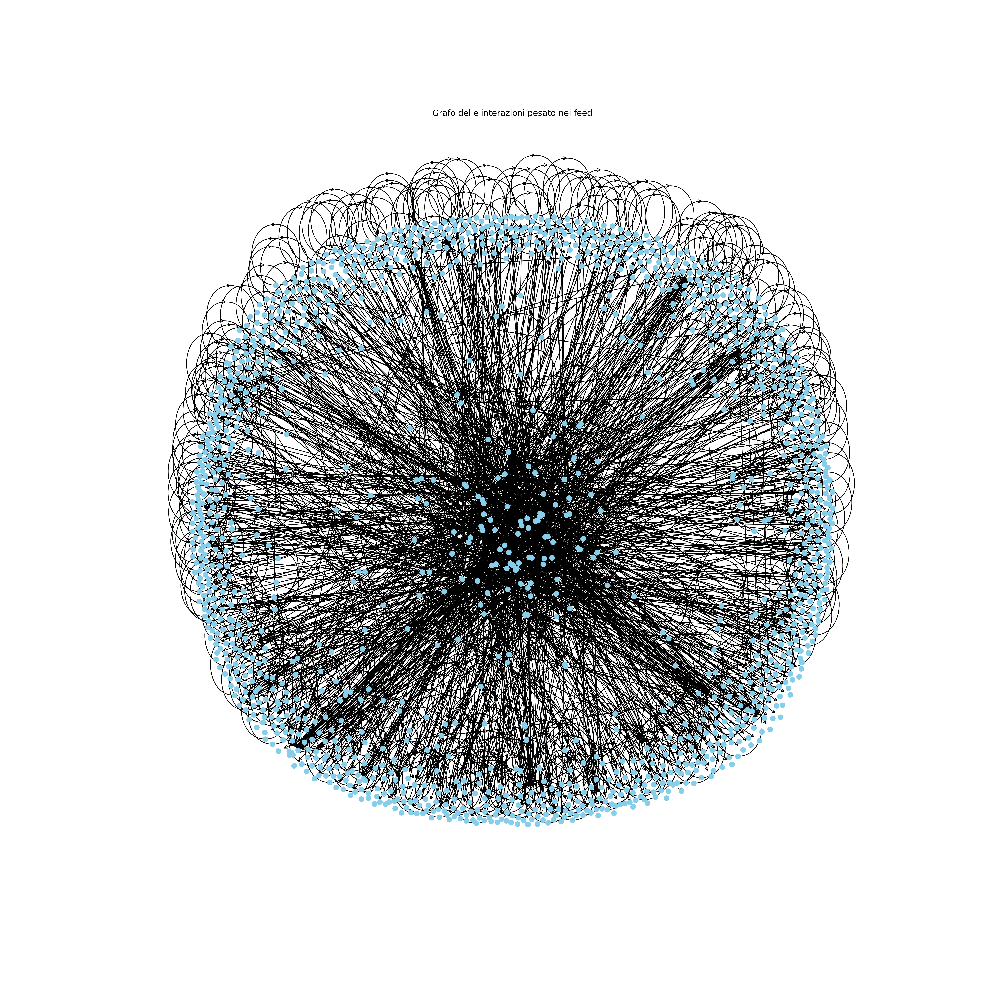

In [1]:
from IPython.display import Image

# Visualizziamo l'immagine salvata del grafo pesato dei feed
Image(filename='/kaggle/input/interaction-graphs/weighted_feed_graph.png')

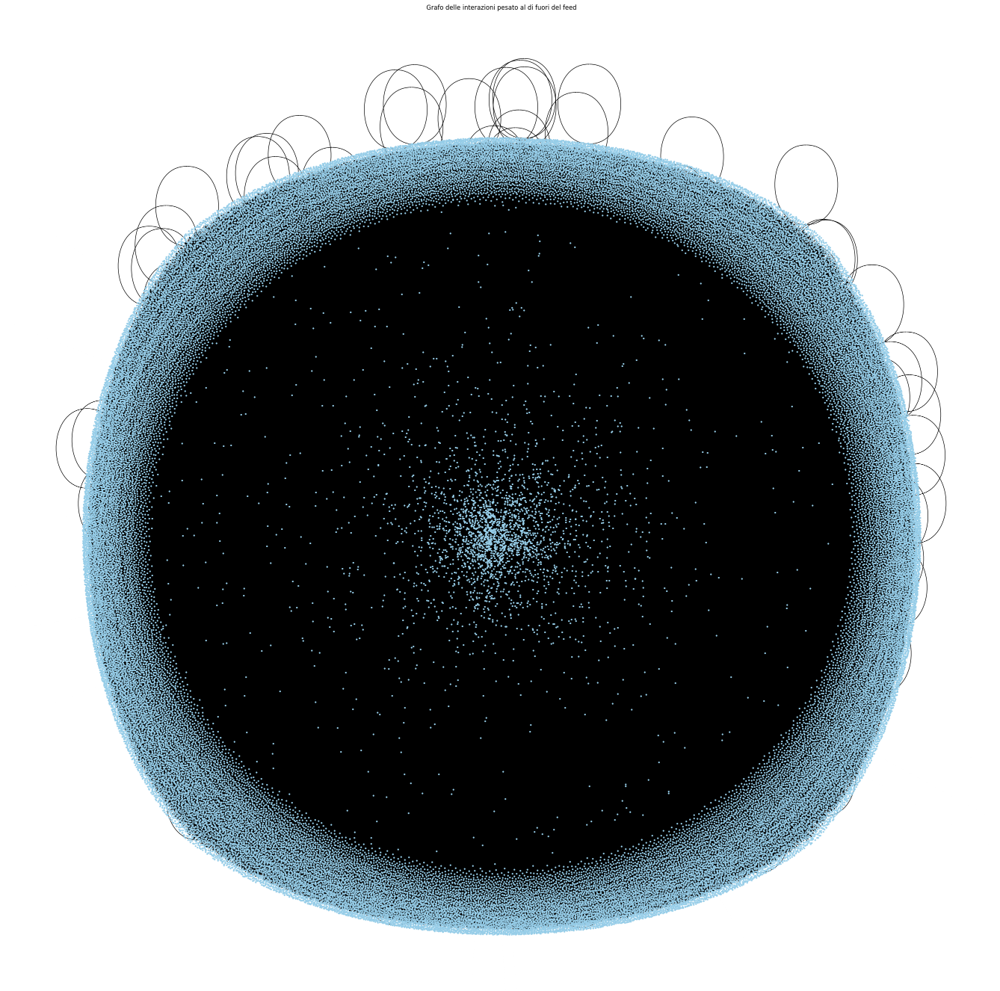

In [2]:
from IPython.display import Image

# Visualizziamo l'immagine salvata del grafo dei feed
Image(filename='/kaggle/input/interaction-graphs/weighted_outside_feed_graph.png')

Il grafo generato con spring_layout non è casuale, ma si basa su un algoritmo che cerca di rappresentare le relazioni tra i nodi come forze fisiche: i nodi che hanno più connessioni tra loro vengono attratti l’uno all’altro, mentre quelli meno connessi tendono a respingersi.   
Per quanto riguarda i due grafi relativi ai post dentro/fuori feed, essi presentano una struttura simile ma con densità di archi differente, il grafo di interazioni fuori dal feed ha una densità meggiore. Per entrambi i grafi è possibile notare:
- **Distribuzione dei nodi**: la maggior parte dei nodi si trova al bordo dei grafi, il che può indicare che molti utenti hanno poche connessioni dirette e interagiscono principalmente con un piccolo numero di utenti.
- **Densità centrale**: in entrambi i grafi vi è una parte centrale densa, suggerendo che ci siano utenti altamente interconnessi e centrali nella rete. Questi nodi centrali sono in numero abbastanza ridotto e potrebbero rappresentare utenti influenti particolarmente attivi nei commenti, repost o citazioni.
- **Struttura della rete**: la struttura delle reti potrebbe riflettere il caso in cui gli utenti centrali agiscono come hub con molte connessioni. Questo potrebbe essere il caso in cui gli utenti centrali sono ad esempio i gestori dei feed i quali possono essere più attivi. 
- **Community**: dal layout non sembra emergere chiaramente la presenza di cluster distinti o comunità isolate, non si evidenzia quindi la presenza di sottogruppi di utenti che interagiscono più tra loro.
- **Strutture a ventaglio**: un altro aspetto interessante (che si nota maggiormente nel grafo dei feed) è la presenza di nodi periferici da cui si diramano numerosi archi, formando strutture a ventaglio. Questi nodi periferici con molte connessioni potrebbero rappresentare utenti che, pur non essendo centrali nella rete globale, mantengono una rete locale di connessioni significativa. Potrebbero essere utenti le cui interazioni sono concentrate in un feed specifico o ad uno specifico sottogruppo di utenti.


Visualizziamo ora i grafi di ciascun feed. 

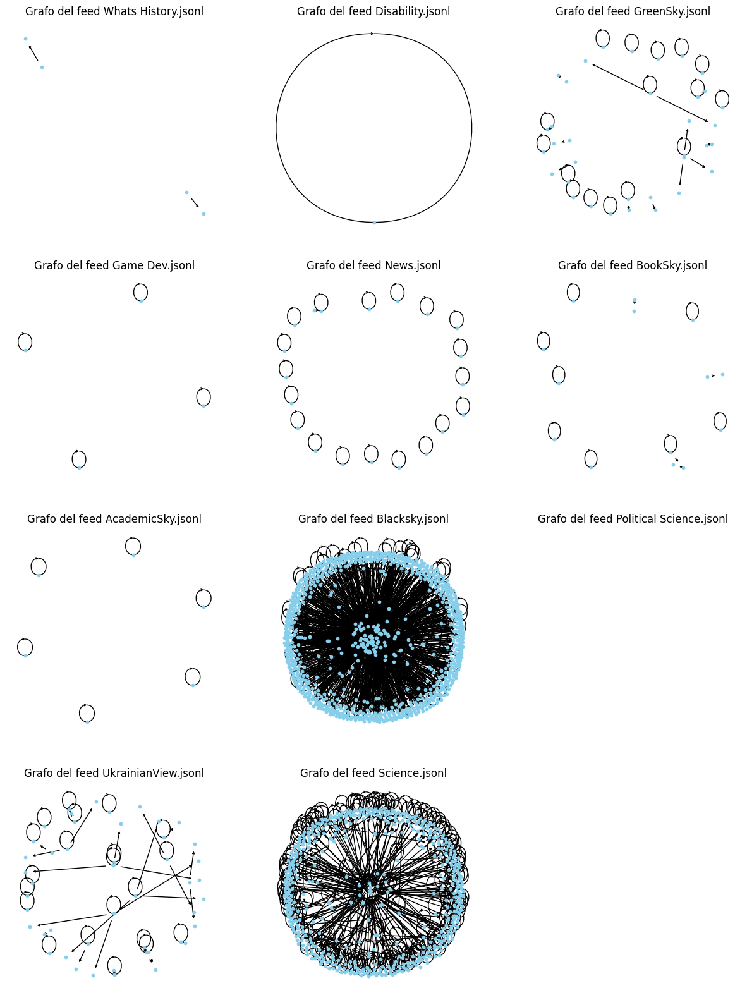

In [32]:
import matplotlib.pyplot as plt
import networkx as nx

n_rows = 4
n_cols = 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

for i in range(len(feed_dataframes), n_rows * n_cols):
    fig.delaxes(axes.flat[i]) # Per non visualizzare l'ultimo asse che non viene utilizzato

    
for i, (feed_name, df) in enumerate(feed_dataframes.items()):
    ax = axes.flat[i] 
    pos = nx.spring_layout(feed_graphs[feed_name], seed=42)
    
    nx.draw_networkx_nodes(feed_graphs[feed_name], pos, ax=ax, node_size=10, node_color='skyblue')
    nx.draw_networkx_edges(feed_graphs[feed_name], pos, ax=ax, edgelist=feed_graphs[feed_name].edges(), arrowstyle='->', arrowsize=5)
    
    ax.set_title(f'Grafo del feed {feed_name}')
    ax.set_axis_off()  # Nasconde gli assi

plt.show()

Osservando i grafi dei singoli feed, si possono effettuare alcune considerazioni: 

- **Due grafi predominanti**: I grafi relativi ai feed "Blacksky" e "Science" mostrano un numero di nodi e una connettività significativamente maggiori rispetto agli altri. Ciò indica che si tratta di feed con utenti molto attivi.  
    Al contrario, la maggior parte degli altri grafi sembra avere strutture molto più sparse, con pochi nodi e poche connessioni tra loro. Alcuni grafi sono addirittura vuoti o consistono in un solo anello. Ciò indica poche interazioni tra utenti all'interno di questi feed.

- **Self-loop**: Nei grafi appaiono molti self-loop i quali indicano che spesso gli utenti interagiscono con i propri post. Questi potrebbero essere commenti, repost o citazioni di se stessi.

## 5. Calcolo dell'engagement 

A questo punto procediamo con il calcolo dell'engagement degli utenti fuori e dentro ai feed. 


Definiamo l'engagement di un utente tenendo in considerazione sia le interazioni che l'utente compie, sia le interazioni che l'utente riceve. In questo modo si ottiene una misura di coinvolgimento più completa, che riflette il ruolo attivo e passivo dell'utente all'interno della rete. Consideriamo quindi sia il numero di commenti, repost e citazioni che un utente riceve, sia quelli che effettua.

Formalmente, l'engagement può essere espresso come una somma ponderata di queste interazioni:

$$
\text{Engagement dell'utente i} = w_1 \cdot (\text{Numero di post creati dall'utente i}) \\
+ w_2 \cdot (\text{Numero di commenti effettuati dall'utente i}) \\
+ w_3 \cdot (\text{Numero di repost effettuati dall'utente i}) \\
+ w_4 \cdot (\text{Numero di citazioni effettuate dall'utente i}) \\
+ w_5 \cdot (\text{Numero di commenti ricevuti dall'utente i}) \\
+ w_6 \cdot (\text{Numero di repost ricevuti dall'utente i}) \\
+ w_7 \cdot (\text{Numero di citazioni ricevute dall'utente i})
$$



In questa formula, i pesi $w_1, \dots, w_7$ permettono di attribuire diversa importanza a ciascun tipo di interazione, in modo da riflettere il loro impatto sull'engagement complessivo.  

Definiamo quindi una serie di funzioni per il calcolo dell'engagement.

In [33]:
# Funzione che calcola il numero di post di ogni utente
def count_posts(posts):
    post_counts = posts.groupby('user_id')['post_id'].count().reset_index()
    post_counts.columns = ['user_id', 'num_posts_created']
    return post_counts.set_index('user_id')['num_posts_created'].to_dict()

# Funzione che calcola il numero di interazioni in entrata e in uscita per ogni utente
def count_interactions(graph, posts):
    user_data = {node: {
        'num_posts_created': 0, 
        'num_comments_made': 0,
        'num_reposts_made': 0,
        'num_quotes_made': 0,
        'num_comments_received': 0,
        'num_reposts_received': 0,
        'num_quotes_received': 0
    } for node in graph.nodes}

    for u, v, interaction_type in graph.edges(data='interaction'):
        if interaction_type == 'comment':
            user_data[u]['num_comments_made'] += 1
            user_data[v]['num_comments_received'] += 1
        elif interaction_type == 'repost':
            user_data[u]['num_reposts_made'] += 1
            user_data[v]['num_reposts_received'] += 1
        elif interaction_type == 'quote':
            user_data[u]['num_quotes_made'] += 1
            user_data[v]['num_quotes_received'] += 1
            
    # Conta i post creati
    post_counts_dict = count_posts(posts)

    for user in user_data.keys():
        user_data[user]['num_posts_created'] = post_counts_dict.get(user, 0)  # Usa 0 se l'utente non ha post
    
    
    return user_data


# Funzione per il calcolo dell'engagement
def calculate_engagement(graph, weights, posts):
    
    user_data = count_interactions(graph, posts)

    users_engagement = {}
    for node in graph.nodes:
        data = user_data[node]
        engagement = (weights['w1'] * data['num_posts_created'] +
                      weights['w2'] * data['num_comments_made'] +
                      weights['w3'] * data['num_reposts_made'] +
                      weights['w4'] * data['num_quotes_made'] +
                      weights['w5'] * data['num_comments_received'] +
                      weights['w6'] * data['num_reposts_received'] +
                      weights['w7'] * data['num_quotes_received'])
        users_engagement[node] = engagement

    return users_engagement

Per iniziare, ipotizziamo che tutti i pesi siano impostati a 1, il che significa che ogni tipo di interazione contribuisce in modo uniforme al calcolo dell'engagement. Si tratta di un'euristica semplice, che verrà successivamente affinata.

In [44]:
weights = {}

for i in range(1,8):
    weights[f'w{i}'] = 1/7
    
engagement_feed = calculate_engagement(feed_graph, weights, df_all_posts)
engagement_outside_feed = calculate_engagement(outside_feed_graph, weights, df_all_posts)

# Stampa di verifica
print('Engagement degli utenti dentro i feed')
for user, engagement in list(engagement_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")
    
print('\nEngagement degli utenti fuori i feed')
for user, engagement in list(engagement_outside_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")

Engagement degli utenti dentro i feed
Utente 33072.0 - Engagement: 1315.8571428571427
Utente 122771.0 - Engagement: 0.14285714285714285
Utente 55083.0 - Engagement: 99.42857142857142
Utente 43518.0 - Engagement: 0.42857142857142855
Utente 9031.0 - Engagement: 421.42857142857144

Engagement degli utenti fuori i feed
Utente 934421 - Engagement: 197.1428571428571
Utente 399109.0 - Engagement: 4.571428571428571
Utente 215906.0 - Engagement: 327.5714285714285
Utente 27939.0 - Engagement: 759.4285714285713
Utente 28011.0 - Engagement: 2318.8571428571427


In [40]:
# Stampa di verifica ordinata per engagement
print('Engagement degli utenti dentro i feed')
for user, engagement in sorted(engagement_feed.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"Utente {user} - Engagement: {engagement}")
    
print('\nEngagement degli utenti fuori i feed')
for user, engagement in sorted(engagement_outside_feed.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"Utente {user} - Engagement: {engagement}")


Engagement degli utenti dentro i feed
Utente 30297.0 - Engagement: 12107.857142857141
Utente 34218.0 - Engagement: 10605.999999999998
Utente 26564.0 - Engagement: 10485.714285714284
Utente 1248.0 - Engagement: 9952.0
Utente 21101.0 - Engagement: 9201.0

Engagement degli utenti fuori i feed
Utente 30297.0 - Engagement: 12133.285714285714
Utente 34218.0 - Engagement: 12016.0
Utente 26564.0 - Engagement: 10524.714285714284
Utente 1248.0 - Engagement: 10071.857142857143
Utente 21585.0 - Engagement: 9269.42857142857


Poiché consideriamo solo gli utenti che hanno creato almeno un post dentro e fuori dai feed, filtriamo i nodi che appaiono in entrambi i grafi:

In [41]:
# Intersezione degli utenti che appaiono sia nei post dentro i feed che fuori dai feed
common_users = set(engagement_feed.keys()).intersection(set(engagement_outside_feed.keys()))

In [42]:
#prendiamo i top 10 utenti fuori dai feed per questo metodo di calcolo dell'engagement
top_10_user_1 = [user for user, _ in sorted(engagement_outside_feed.items(), key=lambda x: x[1], reverse=True)[:10]]

# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement fuori dai feed:')
print(top_10_user_1)


Top 10 ID utenti per engagement fuori dai feed:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]


## 6. Confronto dell'engagement

Confrontiamo adesso l'engagement degli utenti dentro e fuori dai feed in una serie di casi. 

### 6.1 Distribuzione dell'engagment fuori e dentro i feed
Visualizziamo la distribuzione dell'engagment fuori e dentro ai feed per poter effettuare un primo confronto delle interazioni all'interno e all'esterno dei feed.

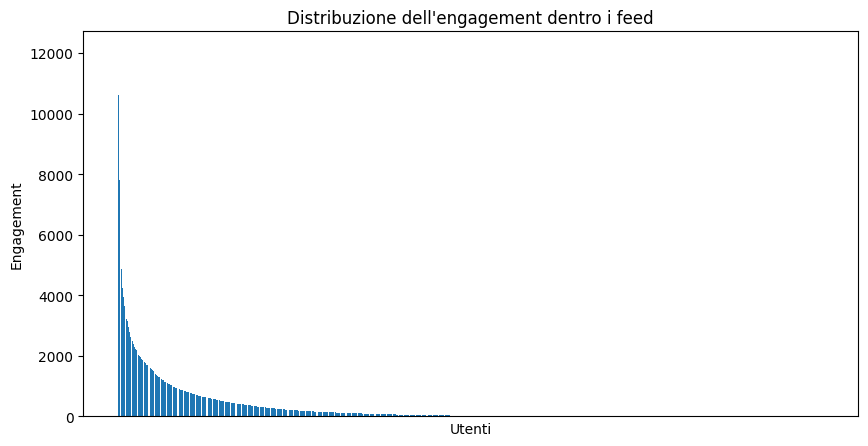

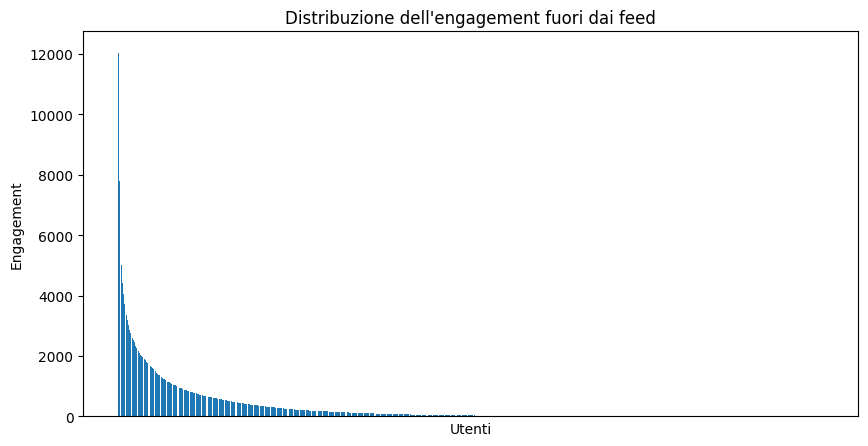

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# Engagement dentro i feed e fuori ordinati in senso decrescente
df_feed = pd.DataFrame(list(engagement_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)
df_outside_feed = pd.DataFrame(list(engagement_outside_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)

# Filtraggio per gli utenti comuni e ordinamento rispetto all'engagment
df_feed = df_feed[df_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)
df_outside_feed = df_outside_feed[df_outside_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)


# Grafico dell'engagement dentro i feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_feed)), df_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement dentro i feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

# Grafico dell'engagement fuori dai feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_outside_feed)), df_outside_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement fuori dai feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()


In [46]:
print("\nStatistiche per Engagement dentro i feed:")
print(df_feed['engagement'].describe())

print("\nStatistiche per Engagement fuori dai feed:")
print(df_outside_feed['engagement'].describe())
  


Statistiche per Engagement dentro i feed:
count     6924.000000
mean       281.301849
std        734.702323
min          0.142857
25%          0.428571
50%         23.571429
75%        204.500000
max      12107.857143
Name: engagement, dtype: float64

Statistiche per Engagement fuori dai feed:
count     6924.000000
mean       301.738013
std        758.167843
min          0.142857
25%          4.571429
50%         32.857143
75%        231.714286
max      12133.285714
Name: engagement, dtype: float64


Dalle distribuzioni di engagement ottenute, emergono alcune considerazioni significative.  
In primo luogo, si osserva che i valori di engagement degli utenti all'interno dei feed sono più o meno simili rispetto a quelli fuori dai feed. Questo è evidente dalle statistiche: l'engagement medio dentro i feed è di /kaggle/input/interaction-graphs/weighted_outside_feed_graph.gpickle, mentre fuori dai feed è di 302. Quindi, **in media, gli utenti hanno un livello di interazione leggermente superiore all'esterno dei feed rispetto a quando pubblicano o interagiscono dentro ai feed**.

Un altro aspetto rilevante è che entrambe le distribuzioni mostrano un comportamento **fortemente asimmetrico con una lunga coda**: un piccolo gruppo di utenti risulta estremamente attivo, mentre la maggioranza presenta livelli di engagement molto bassi. Questo è in linea con quanto ci si aspetta nei social network, dove la maggior parte degli utenti tende a essere meno attiva (spettatori passivi o "lurkers"), e solo un piccolo gruppo di utenti altamente attivi (come gli "influencer") genera la maggior parte delle interazioni.

In conclusione, i dati indicano una chiara tendenza: l'engagement è notevolmente maggiore all'interno dei feed, con una forte concentrazione delle interazioni su pochi utenti molto attivi, caratteristica tipica dei social network.  

### 6.2 Distribuzione della differenza di engagment fuori e dentro i feed

Per confrontare meglio gli utenti consideriamo ulteriori analisi. Innanzitutto visualizziamo la distribuzione della differenza di engagment fuori e dentro ai feed.

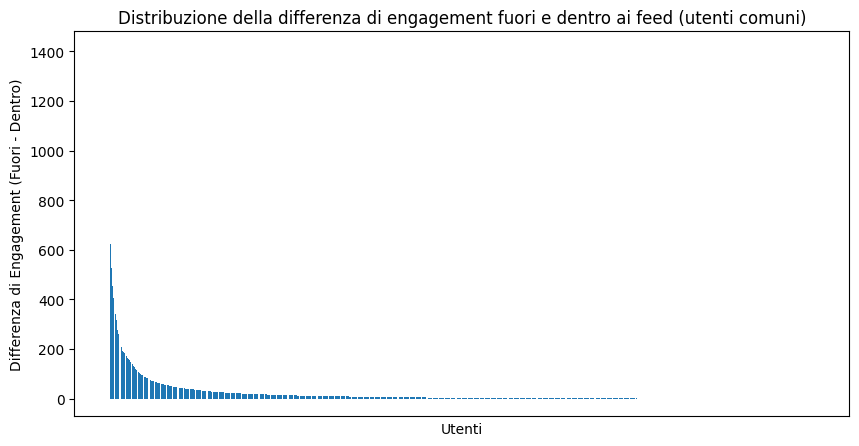

count    6924.000000
mean       20.436164
std        61.373694
min        -1.000000
25%         0.714286
50%         3.714286
75%        14.285714
max      1410.000000
Name: engagement_difference, dtype: float64


In [47]:
import matplotlib.pyplot as plt
import pandas as pd

# Crea una lista di tuple (utente, differenza di engagement)
engagement_difference = [(user, engagement_outside_feed[user] - engagement_feed[user]) for user in common_users]

df_difference = pd.DataFrame(engagement_difference, columns=['user_id', 'engagement_difference']).sort_values(by='engagement_difference', ascending=False)

# Visualizza la distribuzione della differenza di engagement
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_difference)), df_difference['engagement_difference'])
plt.xlabel('Utenti')
plt.ylabel('Differenza di Engagement (Fuori - Dentro)')
plt.title('Distribuzione della differenza di engagement fuori e dentro ai feed (utenti comuni)')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

print(df_difference['engagement_difference'].describe())

In [48]:
# Conta il numero di differenze positive e negative
positive_diff_count = df_difference[df_difference['engagement_difference'] > 0].shape[0]
negative_diff_count = df_difference[df_difference['engagement_difference'] < 0].shape[0]

# Stampa i risultati
print(f"Numero di utenti con differenza positiva (più engagement fuori dai feed): {positive_diff_count}")
print(f"Numero di utenti con differenza negativa (più engagement dentro i feed): {negative_diff_count}")


Numero di utenti con differenza positiva (più engagement fuori dai feed): 6485
Numero di utenti con differenza negativa (più engagement dentro i feed): 17


Notiamo come 6485 utenti hanno un'interazione fuori dai feed che è maggiore rispetto all'interazione all'interno dei feed, mentre per soli 17 utenti si ha un'interazione maggiore all'interno dei feed rispetto che all'esterno.  

### 6.3 Utenti "silenziosi" in uno dei due gruppi e attivi nell'altro

Adesso analizziamo il numero di utenti definiti come 'silenziosi', ossia coloro che presentano un basso livello di interazione all'interno dei feed, mentre risultano piuttosto attivi al di fuori di essi, e viceversa. Consideriamo 'silenziosi' gli utenti con un engagement inferiore al 25° percentile e 'attivi' quelli con un engagement superiore al 25° percentile.

In [50]:
import numpy as np

percentile = 25  

# Otteniamo i valori di engagment
engagement_feed_values = np.array(list(engagement_feed.values()))
engagement_outside_feed_values = np.array(list(engagement_outside_feed.values()))

# Calcoliamo le soglie
threshold_feed = np.percentile(engagement_feed_values, percentile)
threshold_outside_feed = np.percentile(engagement_outside_feed_values, percentile)


# Utenti "silenti" fuori dai feed ma attivi nei feed
silent_outside_active_feed = [user for user in common_users if engagement_outside_feed[user] < threshold_outside_feed and engagement_feed[user] >= threshold_feed]

# Utenti "silenti" dentro i feed ma attivi fuori dai feed
silent_in_feed_active_outside = [user for user in common_users if engagement_feed[user] < threshold_feed and engagement_outside_feed[user] >= threshold_outside_feed]


# Contiamo il numero di utenti in ciascun gruppo
num_silent_outside_active_feed = len(silent_outside_active_feed)
num_silent_in_feed_active_outside = len(silent_in_feed_active_outside)

total_common_users = len(common_users)

# Stampa i risultati
print(f"Numero di utenti 'silenti' fuori dai feed ma attivi nei feed: {num_silent_outside_active_feed} ({num_silent_outside_active_feed / total_common_users * 100:.2f}% del totale)")
print(f"Numero di utenti 'silenti' nei feed ma attivi fuori dai feed: {num_silent_in_feed_active_outside} ({num_silent_in_feed_active_outside / total_common_users * 100:.2f}% del totale)")


Numero di utenti 'silenti' fuori dai feed ma attivi nei feed: 24 (0.35% del totale)
Numero di utenti 'silenti' nei feed ma attivi fuori dai feed: 1156 (16.70% del totale)


Molti più utenti sono maggiormente attivi fuori dai feed e silenziosi dentro ai feed.

## 7. Calcolo avanzato dell'engagement
Procediamo ora con un calcolo più raffinato dell'engagement, utilizzando tecniche più complesse che assegnano pesi diversi alle varie interazioni, in modo da dare importanza diversa ai vari tipi di interazione.

### 7.1 Pesi basati sul livello di impegno dell'utente
In questo approccio, i pesi vengono assegnati in base all'impegno e allo sforzo richiesto all'utente per effettuare le diverse interazioni. Assegniamo valori reali ai pesi usati per calcolare l'engagement, rispettando le seguenti condizioni:

1. La somma totale dei pesi deve essere pari a uno, quindi deve valere la relazione $ w_1 + w_2 + w_3 + w_4 + w_5 + w_6 + w_7 = 1$.
2. I pesi associati alle interazioni uscenti (ovvero alla creazione di un post, ai commenti, ai repost e alle citazioni effettuate dall'utente) devono riflettere l'impegno richiesto per queste azioni. In particolare, vogliamo che i pesi siano ordinati secondo la seguente gerarchia: $ w_1 > w_4 > w_2 > w_3 $.
3. I pesi relativi alle interazioni entranti devono essere equivalenti ai pesi delle corrispondenti interazioni uscenti, in modo da rappresentare l'impegno richiesto a un utente $ j $ per interagire con un post dell'utente $ i $ di cui stiamo calcolando l'engagement. Pertanto, deve valere $ w_2 = w_5 $, $ w_3 = w_6$ e $w_4 = w_7 $.

In base a tali condizioni abbiamo scelto i sequenti pesi:  
$w_1 = 0.2$, $w_2 = 0.12$, $w_3 = 0.10$, $w_4 = 0.18$, $w_5 = 0.12$, $w_6 = 0.10$, $w_7 = 0.18$

In [51]:
weights = {'w1': 0.2, 'w2': 0.12, 'w3': 0.10, 'w4': 0.18, 'w5': 0.12, 'w6': 0.10, 'w7': 0.18}

engagement_feed = calculate_engagement(feed_graph, weights, df_all_posts)
engagement_outside_feed = calculate_engagement(outside_feed_graph, weights, df_all_posts)

# Stampa di verifica
print('Engagement degli utenti dentro i feed')
for user, engagement in list(engagement_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")
    
print('\nEngagement degli utenti fuori i feed')
for user, engagement in list(engagement_outside_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")

Engagement degli utenti dentro i feed
Utente 33072.0 - Engagement: 1842.0200000000002
Utente 122771.0 - Engagement: 0.12
Utente 55083.0 - Engagement: 138.68
Utente 43518.0 - Engagement: 0.42
Utente 9031.0 - Engagement: 589.5

Engagement degli utenti fuori i feed
Utente 934421 - Engagement: 242.26000000000008
Utente 399109.0 - Engagement: 4.0
Utente 215906.0 - Engagement: 456.62
Utente 27939.0 - Engagement: 1058.1000000000001
Utente 28011.0 - Engagement: 3032.1400000000003


Visualizziamo le distribuzioni dei valori di engagment in questo caso.

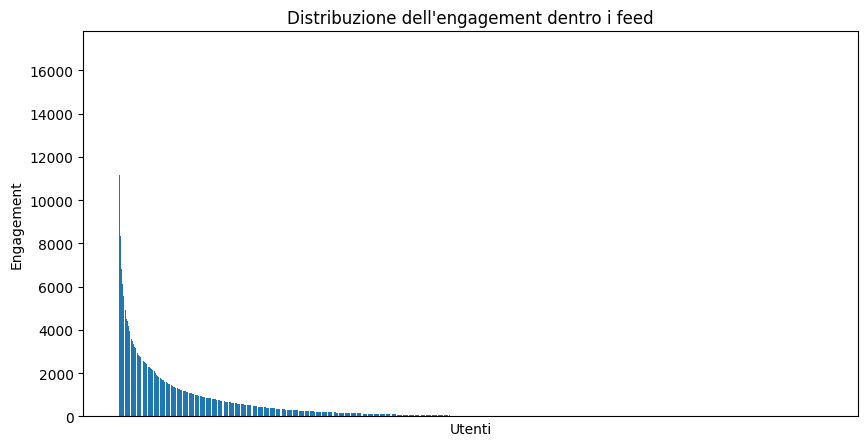

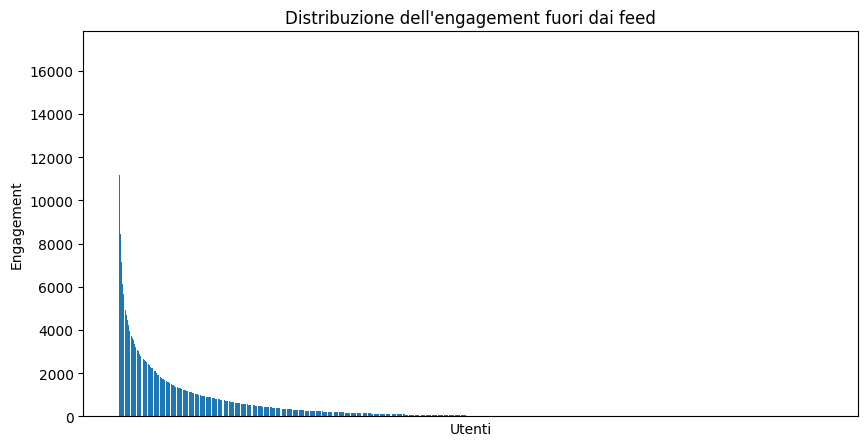

In [52]:
import matplotlib.pyplot as plt
import pandas as pd

# Engagement dentro i feed e fuori ordinati in senso decrescente
df_feed = pd.DataFrame(list(engagement_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)
df_outside_feed = pd.DataFrame(list(engagement_outside_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)

# Filtraggio per gli utenti comuni e ordinamento rispetto all'engagment
df_feed = df_feed[df_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)
df_outside_feed = df_outside_feed[df_outside_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)


# Grafico dell'engagement dentro i feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_feed)), df_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement dentro i feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

# Grafico dell'engagement fuori dai feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_outside_feed)), df_outside_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement fuori dai feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()


In [53]:
#prendiamo i top 10 utenti fuori dai feed per questo metodo di calcolo dell'engagement
top_10_user_2 = [user for user, _ in sorted(engagement_outside_feed.items(), key=lambda x: x[1], reverse=True)[:10]]

# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement fuori dai feed:')
print(top_10_user_2)

Top 10 ID utenti per engagement fuori dai feed:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]


In [54]:
print("\nStatistiche per Engagement dentro i feed:")
print(df_feed['engagement'].describe())

print("\nStatistiche per Engagement fuori dai feed:")
print(df_outside_feed['engagement'].describe())


Statistiche per Engagement dentro i feed:
count     6924.000000
mean       393.730012
std       1028.530024
min          0.120000
25%          0.420000
50%         32.920000
75%        286.280000
max      16950.960000
Name: engagement, dtype: float64

Statistiche per Engagement fuori dai feed:
count     6924.000000
mean       411.703729
std       1048.793119
min          0.100000
25%          4.700000
50%         41.370000
75%        311.405000
max      16977.420000
Name: engagement, dtype: float64


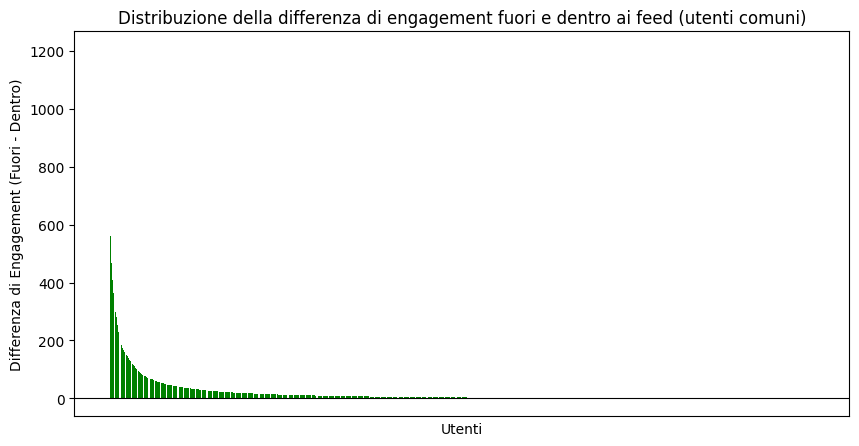

count    6924.000000
mean       17.973718
std        54.224207
min        -2.060000
25%         0.600000
50%         3.060000
75%        12.440000
max      1207.300000
Name: engagement_difference, dtype: float64


In [55]:
import matplotlib.pyplot as plt
import pandas as pd

# Crea una lista di tuple (utente, differenza di engagement)
engagement_difference = [(user, engagement_outside_feed[user] - engagement_feed[user]) for user in common_users]

df_difference = pd.DataFrame(engagement_difference, columns=['user_id', 'engagement_difference']).sort_values(by='engagement_difference', ascending=False)

# Visualizza la distribuzione della differenza di engagement
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_difference)), df_difference['engagement_difference'], color=['green' if val >= 0 else 'red' for val in df_difference['engagement_difference']])
plt.axhline(0, color='black', linewidth=0.8)  # Aggiunge una linea orizzontale a zero
plt.xlabel('Utenti')
plt.ylabel('Differenza di Engagement (Fuori - Dentro)')
plt.title('Distribuzione della differenza di engagement fuori e dentro ai feed (utenti comuni)')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

# Mostra le statistiche descrittive
print(df_difference['engagement_difference'].describe())


In [56]:
# Conta il numero di differenze positive e negative
positive_diff_count = df_difference[df_difference['engagement_difference'] > 0].shape[0]
negative_diff_count = df_difference[df_difference['engagement_difference'] < 0].shape[0]

# Stampa i risultati
print(f"Numero di utenti con differenza positiva (più engagement fuori dai feed): {positive_diff_count}")
print(f"Numero di utenti con differenza negativa (più engagement dentro i feed): {negative_diff_count}")


Numero di utenti con differenza positiva (più engagement fuori dai feed): 6486
Numero di utenti con differenza negativa (più engagement dentro i feed): 331


Anche utilizzando questo approccio per il calcolo dell'engagment gli utenti tendono ad essere più coinvolti all'esterno dei feed.

### 7.2 Pesi basati sulla frequenza delle interazioni

In questo approccio, i pesi vengono determinati in base alla frequenza con cui ciascun tipo di interazione avviene, riflettendo l'importanza relativa di ogni attività in termini di quantità complessiva.
Di conseguenza avremo che i pesi vengono impostati come:  
$$ w_1 = 1 / (\text{Numero totale di post}) $$  
$$ w_2 = w_5 = 1 / (\text{Numero totale di commenti}) $$  
$$ w_3 = w_6 = 1 / (\text{Numero totale di repost}) $$  
$$ w_4 = w_7 = 1 / (\text{Numero totale di citazioni}) $$  

Infine, vengono normalizzati i pesi in modo tale da avere la loro somma pari ad 1.


In [57]:
import networkx as nx
import pandas as pd

def calculate_weights(G, total_post):
    
    # Conteggio degli archi di tipo commento, repost e citazione
    num_comments = sum(1 for _, _, interaction in G.edges(data='interaction') if interaction == 'comment')
    num_reposts = sum(1 for _, _, interaction in G.edges(data='interaction') if interaction == 'repost')
    num_quotes = sum(1 for _, _, interaction in G.edges(data='interaction') if interaction == 'quote')

    # Calcolo dei pesi iniziali
    w1 = 1 / total_post if total_post > 0 else 0
    w2 = 1 / num_comments if num_comments > 0 else 0
    w3 = 1 / num_reposts if num_reposts > 0 else 0
    w4 = 1 / num_quotes if num_quotes > 0 else 0

    # Ripetizioni
    w5 = w2
    w6 = w3
    w7 = w4

    # Somma totale dei 7 pesi
    total_weight = w1 + w2 + w3 + w4 + w5 + w6 + w7

    # Normalizzazione dei 7 pesi
    if total_weight > 0:
        w1 /= total_weight
        w2 /= total_weight
        w3 /= total_weight
        w4 /= total_weight
        w5 /= total_weight
        w6 /= total_weight
        w7 /= total_weight

    # Pesi normalizzati
    weights = {
        'w1': w1,
        'w2': w2,
        'w3': w3,
        'w4': w4,
        'w5': w5,
        'w6': w6,
        'w7': w7
    }
    
    print("weights: ", weights)

    return weights


In [58]:
total_feed_post = len(df_all_feeds)
total_outside_feed_post = len(df_outside_feed_posts)

weights_feed = calculate_weights(feed_graph,total_feed_post)
weight_outside_feed = calculate_weights(outside_feed_graph,total_outside_feed_post)

engagement_feed = calculate_engagement(feed_graph, weights_feed, df_all_posts)
engagement_outside_feed = calculate_engagement(outside_feed_graph, weight_outside_feed, df_all_posts)

# Stampa di verifica
print('Engagement degli utenti dentro i feed')
for user, engagement in list(engagement_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")
      
print('\nEngagement degli utenti fuori i feed')
for user, engagement in list(engagement_outside_feed.items())[:5]:
    print(f"Utente {user} - Engagement: {engagement}")

weights:  {'w1': 4.871887243161268e-06, 'w2': 0.0003839878476564178, 'w3': 0.49956818980099954, 'w4': 4.538640772244931e-05, 'w5': 0.0003839878476564178, 'w6': 0.49956818980099954, 'w7': 4.538640772244931e-05}
weights:  {'w1': 0.5288584093836523, 'w2': 0.08638054518979853, 'w3': 0.04768678879048283, 'w4': 0.10150346132789255, 'w5': 0.08638054518979853, 'w6': 0.04768678879048283, 'w7': 0.10150346132789255}
Engagement degli utenti dentro i feed
Utente 33072.0 - Engagement: 0.045673699838064234
Utente 122771.0 - Engagement: 0.0003839878476564178
Utente 55083.0 - Engagement: 0.005746558324678358
Utente 43518.0 - Engagement: 0.0008133621030352849
Utente 9031.0 - Engagement: 0.016687277650284566

Engagement degli utenti fuori i feed
Utente 934421 - Engagement: 515.0320870996256
Utente 399109.0 - Engagement: 2.46797737890896
Utente 215906.0 - Engagement: 1201.7348660007444
Utente 27939.0 - Engagement: 2781.61703943559
Utente 28011.0 - Engagement: 7209.9811596264235


In [60]:
#prendiamo i top 10 utenti fuori dai feed per questo metodo di calcolo dell'engagement
top_10_user_3 = [user for user, _ in sorted(engagement_outside_feed.items(), key=lambda x: x[1], reverse=True)[:10]]

# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement fuori dai feed:')
print(top_10_user_3)

Top 10 ID utenti per engagement fuori dai feed:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]


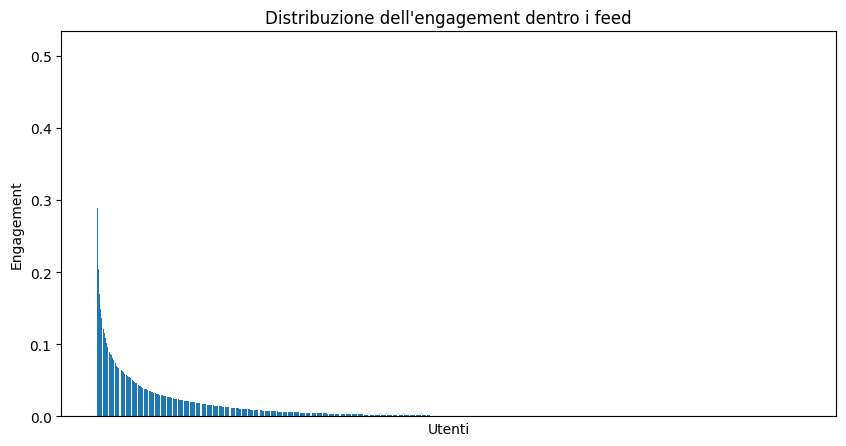

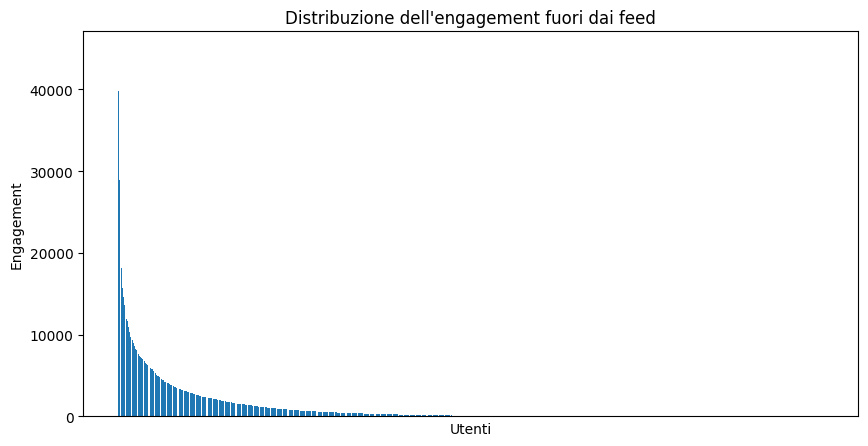

In [61]:
import matplotlib.pyplot as plt
import pandas as pd

# Engagement dentro i feed e fuori ordinati in senso decrescente
df_feed = pd.DataFrame(list(engagement_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)
df_outside_feed = pd.DataFrame(list(engagement_outside_feed.items()), columns=['user_id', 'engagement']).sort_values(by='engagement', ascending=False)

# Filtraggio per gli utenti comuni e ordinamento rispetto all'engagment
df_feed = df_feed[df_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)
df_outside_feed = df_outside_feed[df_outside_feed['user_id'].isin(common_users)].sort_values(by='engagement', ascending=False)


# Grafico dell'engagement dentro i feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_feed)), df_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement dentro i feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

# Grafico dell'engagement fuori dai feed
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_outside_feed)), df_outside_feed['engagement'])
plt.xlabel('Utenti')
plt.ylabel('Engagement')
plt.title('Distribuzione dell\'engagement fuori dai feed')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()


In [62]:
print("\nStatistiche per Engagement dentro i feed:")
print(df_feed['engagement'].describe())

print("\nStatistiche per Engagement fuori dai feed:")
print(df_outside_feed['engagement'].describe())


Statistiche per Engagement dentro i feed:
count    6924.000000
mean        0.009933
std         0.025914
min         0.000045
25%         0.000136
50%         0.001073
75%         0.007281
max         0.508218
Name: engagement, dtype: float64

Statistiche per Engagement fuori dai feed:
count     6924.000000
mean      1050.030324
std       2729.640739
min          0.047687
25%          4.809045
50%         89.132818
75%        769.666937
max      44837.484670
Name: engagement, dtype: float64


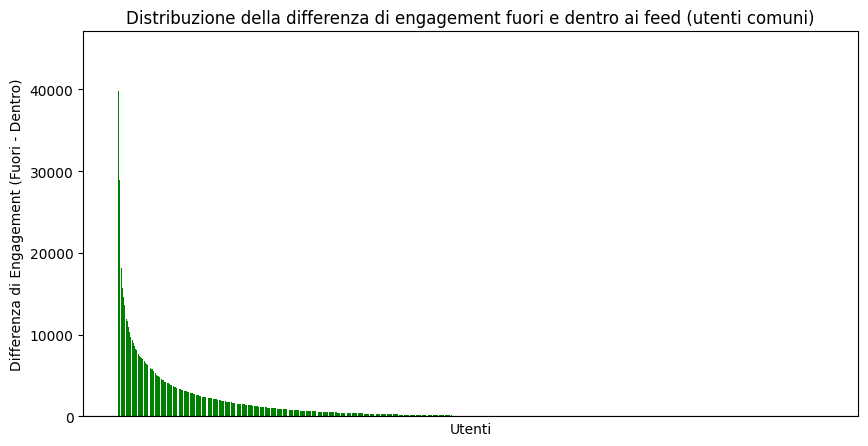

count     6924.000000
mean      1050.020391
std       2729.615570
min          0.047257
25%          4.809000
50%         89.131814
75%        769.659804
max      44837.071672
Name: engagement_difference, dtype: float64


In [63]:
import matplotlib.pyplot as plt
import pandas as pd

# Crea una lista di tuple (utente, differenza di engagement)
engagement_difference = [(user, engagement_outside_feed[user] - engagement_feed[user]) for user in common_users]

df_difference = pd.DataFrame(engagement_difference, columns=['user_id', 'engagement_difference']).sort_values(by='engagement_difference', ascending=False)

# Visualizza la distribuzione della differenza di engagement
plt.figure(figsize=(10, 5))
plt.bar(range(len(df_difference)), df_difference['engagement_difference'], color=['green' if val >= 0 else 'red' for val in df_difference['engagement_difference']])
plt.axhline(0, color='black', linewidth=0.8)  # Aggiunge una linea orizzontale a zero
plt.xlabel('Utenti')
plt.ylabel('Differenza di Engagement (Fuori - Dentro)')
plt.title('Distribuzione della differenza di engagement fuori e dentro ai feed (utenti comuni)')
plt.xticks([])  # Nasconde gli ID degli utenti
plt.show()

# Mostra le statistiche descrittive
print(df_difference['engagement_difference'].describe())


In [64]:
# Conta il numero di differenze positive e negative
positive_diff_count = df_difference[df_difference['engagement_difference'] > 0].shape[0]
negative_diff_count = df_difference[df_difference['engagement_difference'] < 0].shape[0]

# Stampa i risultati
print(f"Numero di utenti con differenza positiva (più engagement fuori dai feed): {positive_diff_count}")
print(f"Numero di utenti con differenza negativa (più engagement dentro i feed): {negative_diff_count}")


Numero di utenti con differenza positiva (più engagement fuori dai feed): 6924
Numero di utenti con differenza negativa (più engagement dentro i feed): 0


Anche in questo caso si ottiene che gli utenti tendono a presentare un engagement maggiore all'esterno dei feed.

### 7.3 Utenti che postano fuori dai feed in top-10 per tutti e tre i metodi di calcolo

In [66]:
# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement di tipo 1:')
print(top_10_user_1)

# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement di tipo 2:')
print(top_10_user_2)

# Stampa della lista degli ID utenti
print('Top 10 ID utenti per engagement di tipo 3:')
print(top_10_user_3)

# Calcolo degli utenti in comune tra le prime tre liste usando intersection()
top_users = set(top_10_user_1).union(top_10_user_2, top_10_user_3)

# Stampa della lista degli utenti in comune
print('Utenti in comune tra le prime tre liste:')
print(top_users)

# Contare i post fatti dai top_users nel DataFrame df_outside_feed_posts
post_count_top_users = df_outside_feed_posts[df_outside_feed_posts['user_id'].isin(top_users)].shape[0]

# Stampa del numero di post
print(f"Numero di post fatti dai top_users: {post_count_top_users}")

Top 10 ID utenti per engagement di tipo 1:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]
Top 10 ID utenti per engagement di tipo 2:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]
Top 10 ID utenti per engagement di tipo 3:
[30297.0, 34218.0, 26564.0, 1248.0, 21585.0, 21101.0, 189282.0, 4983.0, 3530.0, 32279.0]
Utenti in comune tra le prime tre liste:
{1248.0, 189282.0, 26564.0, 32279.0, 34218.0, 3530.0, 21101.0, 21585.0, 4983.0, 30297.0}
Numero di post fatti dai top_users: 5000


In [67]:
# Creazione di un DataFrame per i top_users
top_users_df = df_outside_feed_posts[df_outside_feed_posts['user_id'].isin(top_users)]

# Conteggio dei post per ogni utente
post_count_per_user = top_users_df.groupby('user_id').size().reset_index(name='post_count')

# Stampa del numero di post per ogni utente
print('Numero di post per ogni utente in comune:')
print(post_count_per_user)

Numero di post per ogni utente in comune:
   user_id  post_count
0    34218        5000


In [69]:
# Estrai gli user_id dal DataFrame post_count_per_user
user_ids = post_count_per_user['user_id']

# Filtra df_outside_feed_posts per ottenere le righe con user_id in post_count_per_user
filtered_posts = df_outside_feed_posts[df_outside_feed_posts['user_id'].isin(user_ids)]

# Stampa il numero totale di post filtrati
print(f'Numero totale di post filtrati: {filtered_posts.shape[0]}')

# Stampa il DataFrame filtrato (opzionale)
print(filtered_posts)

import pandas as pd

# Limita a un massimo di 5000 post casuali per ciascun utente
limited_posts = filtered_posts.groupby('user_id').apply(lambda x: x.sample(n=min(len(x), 5000), random_state=42)).reset_index(drop=True)

# Stampa il numero totale di post nel nuovo DataFrame
print(f'Numero totale di post limitati per utente: {limited_posts.shape[0]}')

# Stampa il DataFrame finale (opzionale)
print(limited_posts)


Numero totale di post filtrati: 5000
         post_id  user_id     instance                    date  \
20000    4748869    34218  bsky.social 1976-05-30 13:48:10.334   
20001  179032198    34218  bsky.social 1976-05-30 12:44:20.317   
20002  179035524    34218  bsky.social 1976-05-30 12:43:10.020   
20003  179008913    34218  bsky.social 1976-05-30 13:47:01.807   
20004   10949255    34218  bsky.social 1976-05-30 13:01:30.443   
...          ...      ...          ...                     ...   
24995  179051032    34218  bsky.social 1976-05-30 12:10:21.906   
24996  179013948    34218  bsky.social 1976-05-30 13:18:01.344   
24997  179014551    34218  bsky.social 1976-05-30 13:17:31.214   
24998  179011996    34218  bsky.social 1976-05-30 13:32:20.139   
24999   35828064    34218  bsky.social 1976-05-30 13:14:31.335   

                                                    text    langs  like_count  \
20000                                               None  ['eng']          19   
20001  S

/tmp/ipykernel_30/2398951919.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_posts = filtered_posts.groupby('user_id').apply(lambda x: x.sample(n=min(len(x), 5000), random_state=42)).reset_index(drop=True)


In [71]:
limited_posts.to_json("outside_feed_limited_posts.json", orient="columns", indent=4)